In [1]:
# Import libraries
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib import image

import os

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LassoCV
from sklearn.preprocessing import LabelBinarizer, StandardScaler
from sklearn.metrics import mean_absolute_error

In [2]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.sequence import pad_sequences

from keras.models import Sequential
from keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten
from keras.datasets import mnist, cifar10
from keras.utils import to_categorical
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications import imagenet_utils
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from keras.applications import ResNet50
from scipy import signal
import random
import tensorflow as tf
import seaborn as sns
import h5py

In [3]:
# Open the HDF5 file in read-only mode
f = h5py.File('spectrograms.h5', 'r')
list(f.keys())


['amecro',
 'barswa',
 'bkcchi',
 'blujay',
 'daejun',
 'houfin',
 'mallar3',
 'norfli',
 'rewbla',
 'stejay',
 'wesmea',
 'whcspa']

In [4]:
dset = f['blujay']
dset.shape

(256, 343, 50)

In [5]:
dset = f['barswa']
dset.shape

(256, 343, 55)

In [6]:
dset.shape[0]

256

## Plots of spectrogram for each dataset




C:\Users\amazi\anaconda3\Lib\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 52, using nperseg = 52
  warnings.warn('nperseg = {0:d} is greater than input length '


Times shape: (1,)
Frequency shape: (27,)
Spectrogram shape: (256, 343, 27)


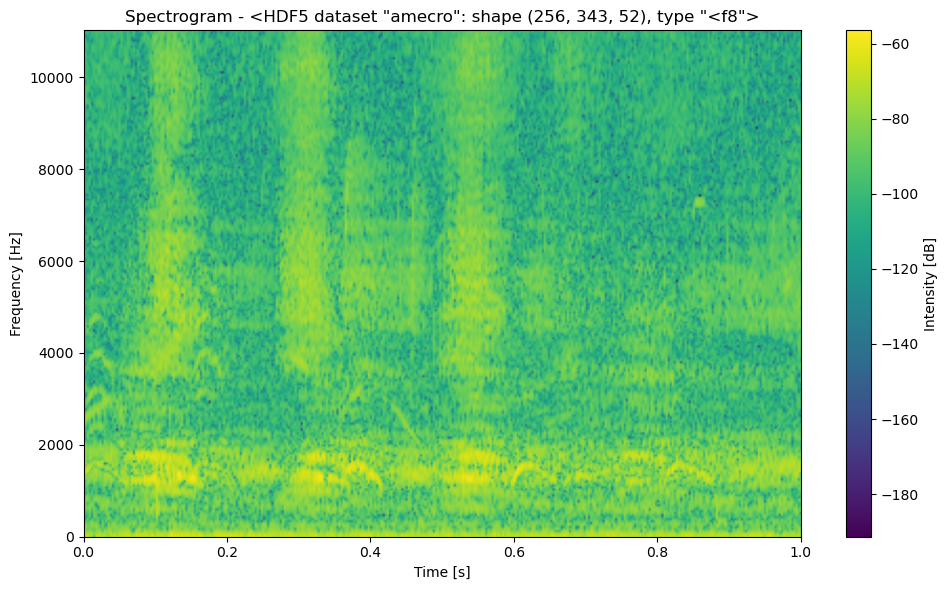

C:\Users\amazi\anaconda3\Lib\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 55, using nperseg = 55
  warnings.warn('nperseg = {0:d} is greater than input length '


Times shape: (1,)
Frequency shape: (28,)
Spectrogram shape: (256, 343, 28)


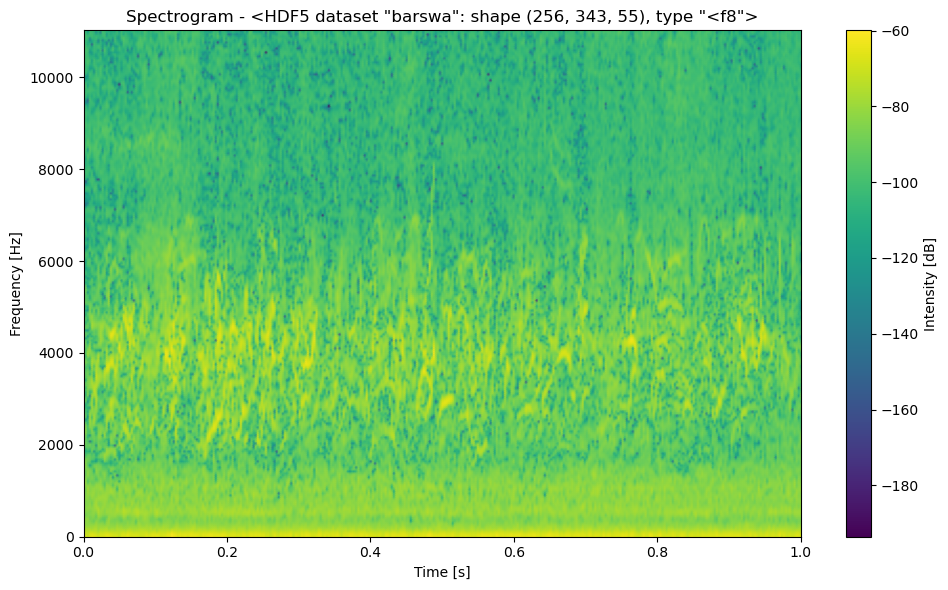

C:\Users\amazi\anaconda3\Lib\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 57, using nperseg = 57
  warnings.warn('nperseg = {0:d} is greater than input length '


Times shape: (1,)
Frequency shape: (29,)
Spectrogram shape: (256, 343, 29)


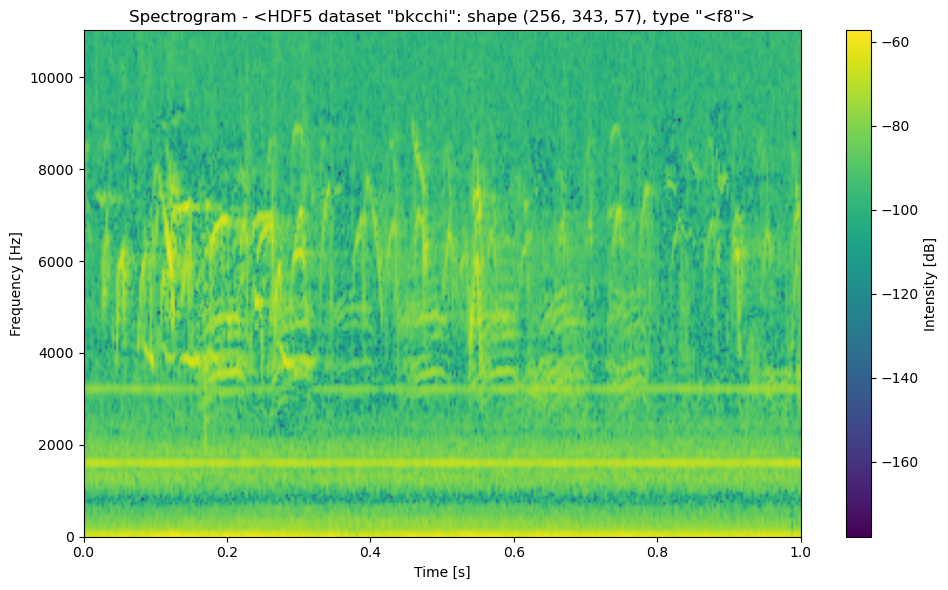

C:\Users\amazi\anaconda3\Lib\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 50, using nperseg = 50
  warnings.warn('nperseg = {0:d} is greater than input length '


Times shape: (1,)
Frequency shape: (26,)
Spectrogram shape: (256, 343, 26)


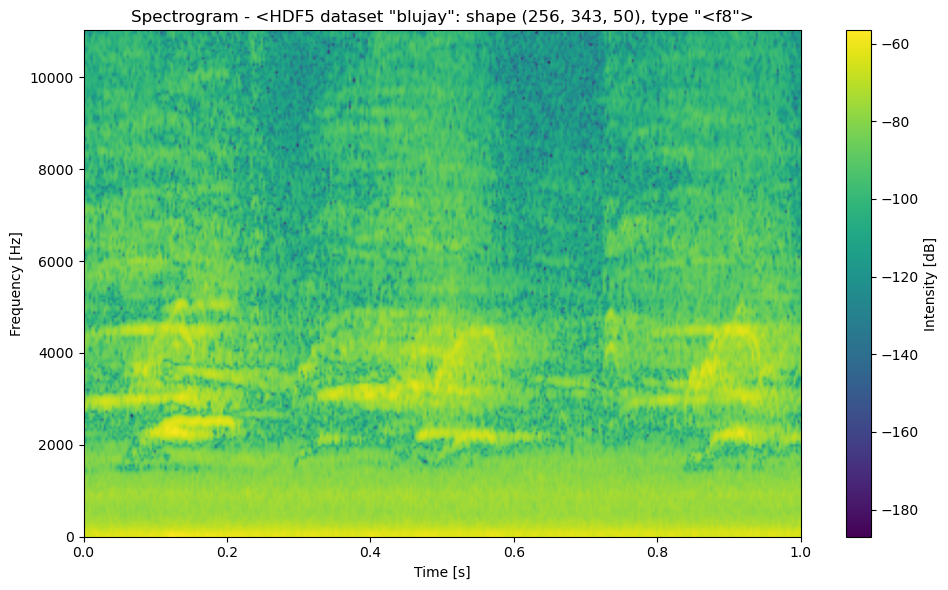

C:\Users\amazi\anaconda3\Lib\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 58, using nperseg = 58
  warnings.warn('nperseg = {0:d} is greater than input length '


Times shape: (1,)
Frequency shape: (30,)
Spectrogram shape: (256, 343, 30)


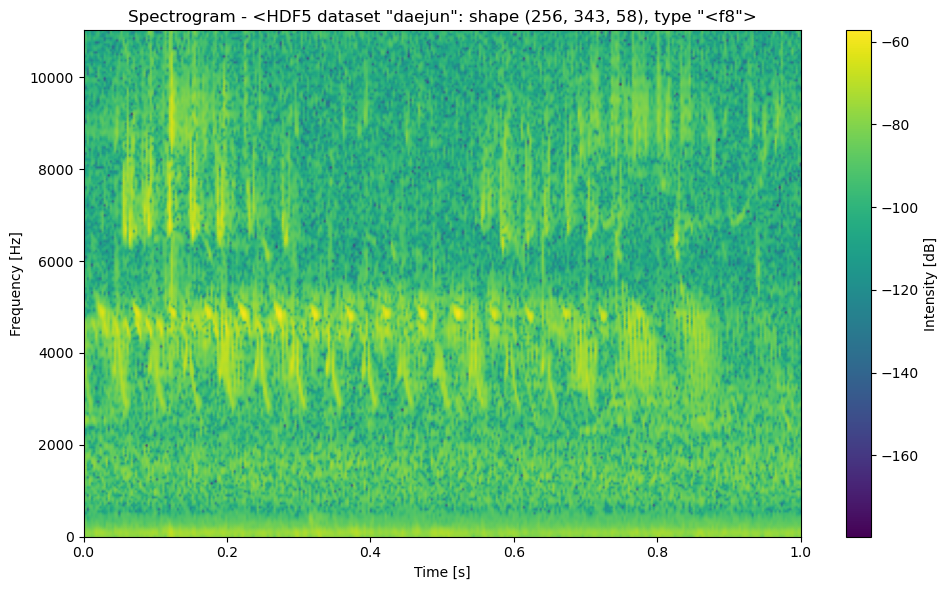

C:\Users\amazi\anaconda3\Lib\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 44, using nperseg = 44
  warnings.warn('nperseg = {0:d} is greater than input length '


Times shape: (1,)
Frequency shape: (23,)
Spectrogram shape: (256, 343, 23)


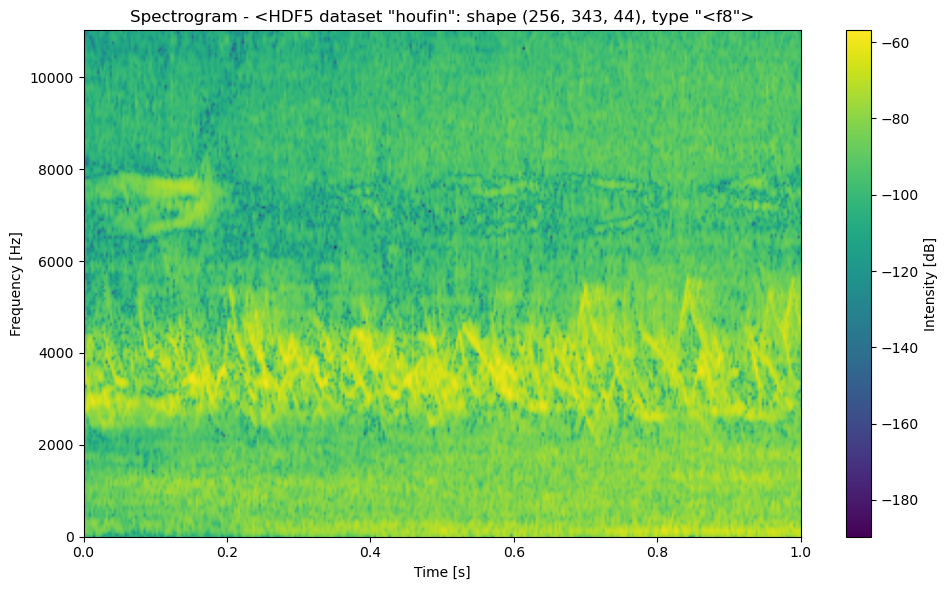

C:\Users\amazi\anaconda3\Lib\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 36, using nperseg = 36
  warnings.warn('nperseg = {0:d} is greater than input length '


Times shape: (1,)
Frequency shape: (19,)
Spectrogram shape: (256, 343, 19)


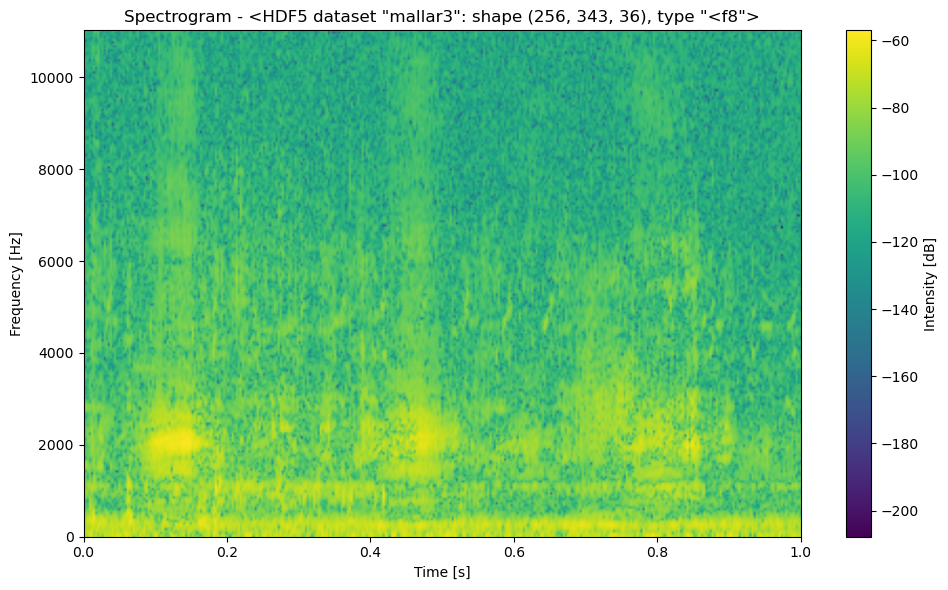

C:\Users\amazi\anaconda3\Lib\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 59, using nperseg = 59
  warnings.warn('nperseg = {0:d} is greater than input length '


Times shape: (1,)
Frequency shape: (30,)
Spectrogram shape: (256, 343, 30)


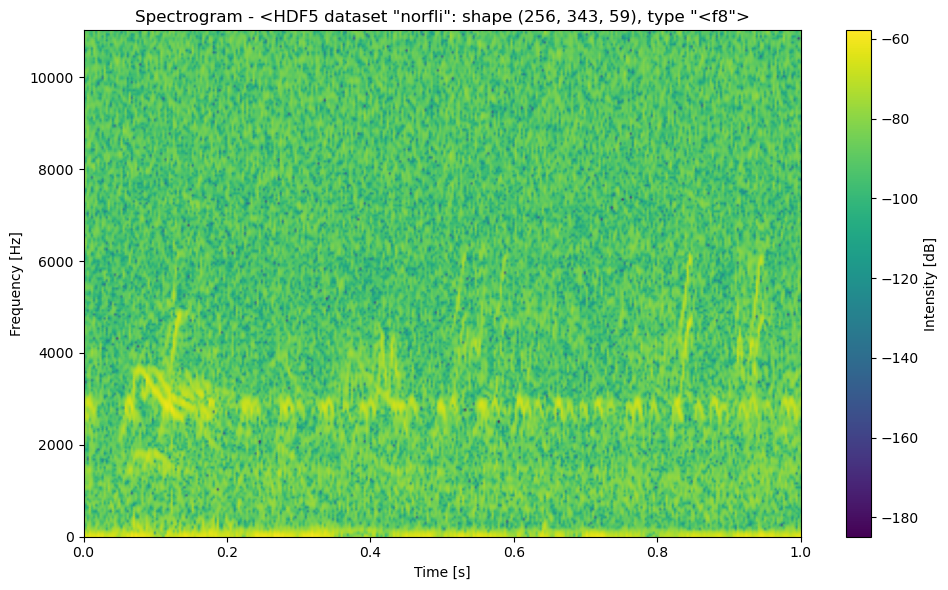

C:\Users\amazi\anaconda3\Lib\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 41, using nperseg = 41
  warnings.warn('nperseg = {0:d} is greater than input length '


Times shape: (1,)
Frequency shape: (21,)
Spectrogram shape: (256, 343, 21)


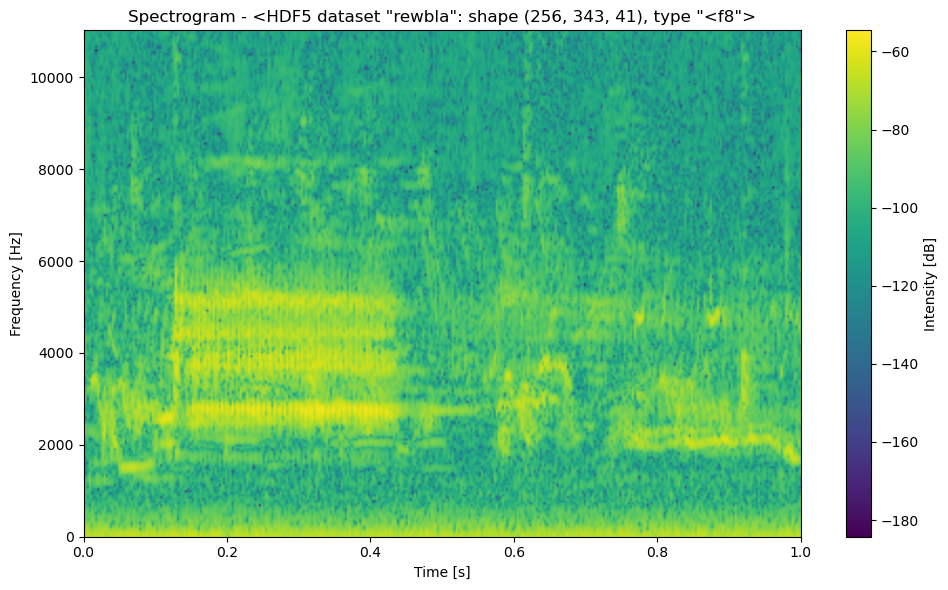

C:\Users\amazi\anaconda3\Lib\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 40, using nperseg = 40
  warnings.warn('nperseg = {0:d} is greater than input length '


Times shape: (1,)
Frequency shape: (21,)
Spectrogram shape: (256, 343, 21)


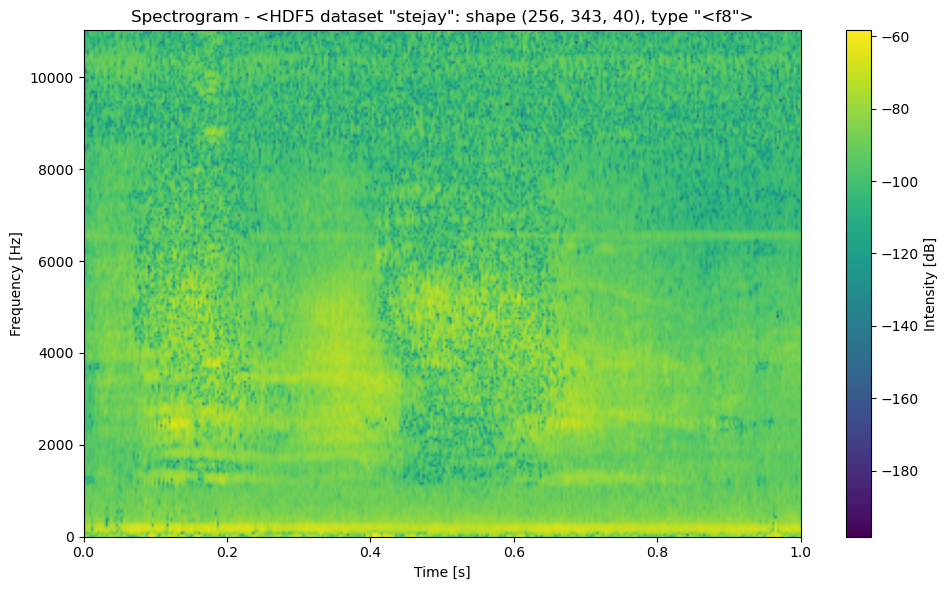

Times shape: (1,)
Frequency shape: (19,)
Spectrogram shape: (256, 343, 19)


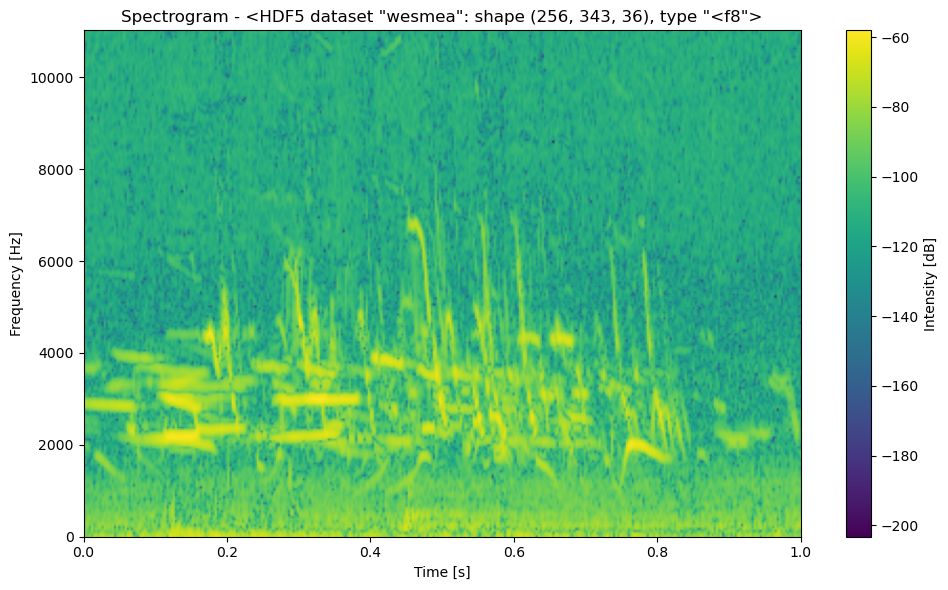

C:\Users\amazi\anaconda3\Lib\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 51, using nperseg = 51
  warnings.warn('nperseg = {0:d} is greater than input length '


Times shape: (1,)
Frequency shape: (26,)
Spectrogram shape: (256, 343, 26)


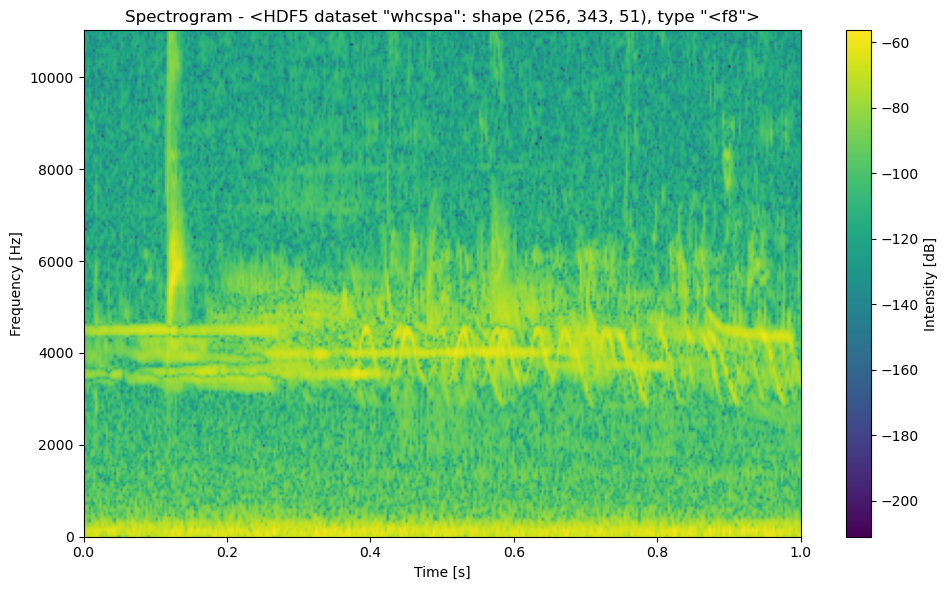

In [7]:
#code iterates over each dataset in an HDF5 file, processes the spectrogram data, and plots the spectrogram for each dataset
f = h5py.File('spectrograms.h5', 'r')
for bird, data in f.items():
    spectrogram_data = np.array(data)
    frequency, times, spectrogram = signal.spectrogram(spectrogram_data, fs=22050)
    spectrogram = np.squeeze(spectrogram)
    print("Times shape:", times.shape)
    print("Frequency shape:", frequency.shape)
    print("Spectrogram shape:", spectrogram.shape)

    if times.shape[0] != spectrogram.shape[1]:
        times = np.linspace(0, 1, spectrogram.shape[1])

    if frequency.shape[0] != spectrogram.shape[0]:
        frequency = np.linspace(0, 22050 / 2, spectrogram.shape[0])

    # Plot the spectrogram
    plt.figure(figsize=(10, 6))
    plt.pcolormesh(times, frequency, 10 * np.log10(spectrogram[:, :, 0]), shading='gouraud', cmap='viridis')
    plt.title(f"Spectrogram - {data}")
    plt.xlabel("Time [s]")
    plt.ylabel("Frequency [Hz]")
    plt.colorbar(label='Intensity [dB]')
    plt.tight_layout()
    plt.show()




## Binary Classification: Blue Jay vs Barn Swallow
### Data Preprocessing

In [8]:
#here the below code processes data and labels for 'blujay' and 'barswa' birds from an HDF5 file, combines the features and labels, and then splits the data into training and test sets
def preprocess_f(data, target=(343, 256)):
    if data.shape[1:] < target:
        padding = np.zeros((data.shape[0], target[0], target[1] - data.shape[2]))
        data = np.concatenate((data, padding), axis=2)
    elif data.shape[1:] > target:
        data = data[:, :target[0], :target[1]]
    return data


blujayFeatures = []
barswaFeatures = []
labels = []

for key in f.keys():
    data = np.array(f[key])
    if key == 'blujay':
        processed = preprocess_f(data)
        blujayFeatures.append(processed)
        labels.extend([0] * processed.shape[0])
    elif key == 'barswa':
        processed= preprocess_f(data)
        barswaFeatures.append(processed)
        labels.extend([1] * processed.shape[0])


blujayFeatures = np.concatenate(blujayFeatures, axis=0)
barswaFeatures = np.concatenate(barswaFeatures, axis=0)

features = np.concatenate((blujayFeatures, barswaFeatures), axis=0)
labels = np.array(labels)


print("Features shape:", features.shape)
print("Labels shape:", labels.shape)
np.random.seed(155)
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.3, random_state=155)

Features shape: (512, 343, 256)
Labels shape: (512,)


### Model 1

In [9]:
#defines and summarizes a convolutional neural network architecture for binary classification, consisting of convolutional, pooling, flattening, and dense layers
model_cnn = Sequential(
    [
    Conv2D(filters=32, kernel_size=(3,3), activation='relu', input_shape=(343, 256,1)),
    MaxPooling2D(pool_size=(2,2)),
    Conv2D(filters=64, kernel_size=(3,3), activation='relu'),
    MaxPooling2D(pool_size=(2,2)),
    Flatten(),
    Dense(units=128, activation='relu'),
    Dense(units=1, activation='sigmoid')
    ])

model_cnn.summary()

C:\Users\amazi\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 341, 254, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 170, 127, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 168, 125, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 84, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 333312)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      42,664,064 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 42,683,009 (162.82 MB)

 Trainable params: 42,683,009 (162.82 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
#following code compiles the CNN model with binary cross-entropy loss and Adam optimizer, then trains it on the training data while validating on the test data

model_cnn.compile(loss='binary_crossentropy',
                optimizer='adam',
                metrics=['accuracy'])

history=model_cnn.fit(X_train, y_train,
            epochs=5,
            batch_size=32,
            validation_data=(X_test, y_test),
            verbose=0)



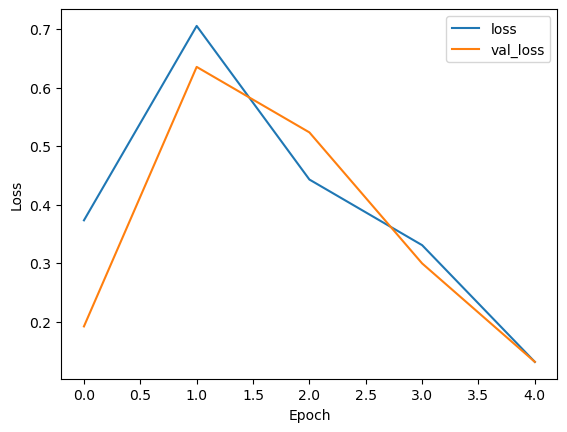

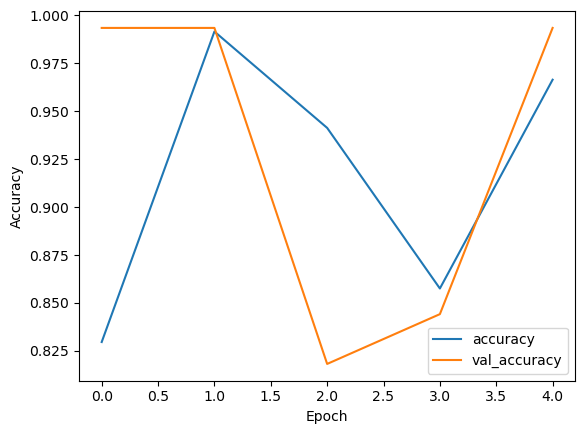

In [11]:
#plots the training and validation loss and accuracy over the epochs from the model training history.
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show();

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['accuracy', 'val_accuracy'], loc='lower right')
plt.show();

In [12]:
#the code evaluates the trained CNN model on the test data and prints the test accuracy.
score = model_cnn.evaluate(X_test, y_test, verbose=0)
print("Test Accuracy: {:.2f}%".format(score[1]*100))

Test Accuracy: 99.35%


### Model 2

In [13]:
#below code defines a more complex CNN model with dropout regularization and summarizes its architecture.
model_cnn = Sequential(
    [
    Conv2D(filters=32, kernel_size=(3,3), activation='relu', input_shape=(343, 256,1)),
    MaxPooling2D(pool_size=(2,2)),
    Conv2D(filters=64, kernel_size=(3,3), activation='relu'),
    MaxPooling2D(pool_size=(2,2)),
    Flatten(),
    Dropout(rate=0.5),
    Dense(units=128, activation='relu'),
    Dense(units=1, activation='sigmoid')
    ])

model_cnn.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 341, 254, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 170, 127, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 168, 125, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 84, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 333312)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 333312)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │      42,664,064 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 42,683,009 (162.82 MB)

 Trainable params: 42,683,009 (162.82 MB)

 Non-trainable params: 0 (0.00 B)

In [14]:
#compiles and trains the CNN model with dropout regularization on the training data , while validating on the test data

model_cnn.compile(loss='binary_crossentropy',
                optimizer='adam',
                metrics=['accuracy'])

history=model_cnn.fit(X_train, y_train,
            epochs=5,
            batch_size=64,
            validation_data=(X_test, y_test),
            verbose=0)



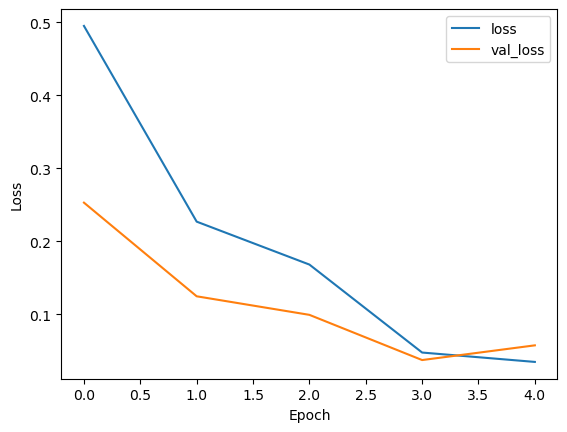

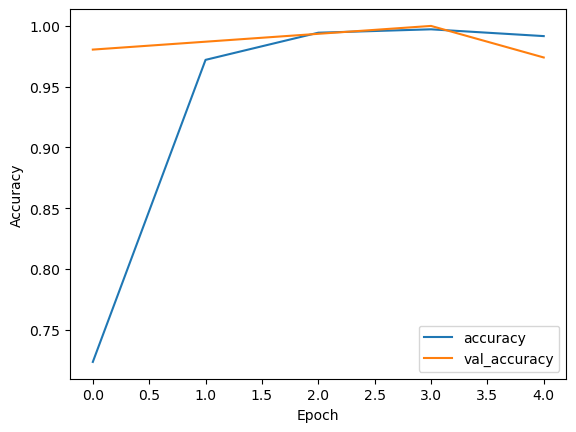

In [15]:
#plots the training and validation loss and accuracy over the epochs from the model training history.
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show();

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['accuracy', 'val_accuracy'], loc='lower right')
plt.show();

In [16]:
#the code evaluates the trained CNN model on the test data and prints the test accuracy.
score = model_cnn.evaluate(X_test, y_test, verbose=0)
print("Test Accuracy: {:.2f}%".format(score[1]*100))

Test Accuracy: 97.40%


## Multi-class CLassification: All 12 Species
### Data preprocessing

In [4]:
#below processes spectrogram data from an HDF5 file, prepares the features and labels for training the model
def preprocess_f(data, target=(343, 256)):
    if data.shape[1:] < target:
        padding = np.zeros((data.shape[0], target[0], target[1] - data.shape[2]))
        data = np.concatenate((data, padding), axis=2)
    elif data.shape[1:] > target:
        data = data[:, :target[0], :target[1]]
    return data

features = []
labels = []
i=0
for key in f.keys():
    data = np.array(f[key])
    processed = preprocess_f(data)
    features.append(processed)
    labels.extend([i] * processed.shape[0])
    i=i+1


features = np.concatenate(features, axis=0)
labels = np.array(labels)


print("Features shape:", features.shape)
print("Labels shape:", labels.shape)
np.random.seed(195)

num_classes = 12  # Assuming you have 12 classes
labels = to_categorical(labels, num_classes=num_classes)


X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.5, random_state=195)

Features shape: (3072, 343, 256)
Labels shape: (3072,)


### Model 1

In [5]:
#here code is defining convolutional neural network model for multi-class classification, summarizes its architecture, and prints the summary
model_cnn = Sequential(
    [
    Conv2D(filters=32, kernel_size=(3,3), activation='relu', input_shape=(343, 256,1)),
    MaxPooling2D(pool_size=(2,2)),
    Conv2D(filters=64, kernel_size=(3,3), activation='relu'),
    MaxPooling2D(pool_size=(2,2)),
    Flatten(),
    Dropout(rate=0.7),
    Dense(units=128, activation='relu'),
    Dense(units=12, activation='softmax')
    ])

model_cnn.summary()

C:\Users\amazi\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 341, 254, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 170, 127, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 168, 125, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 84, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 333312)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 333312)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      42,664,064 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 42,684,428 (162.83 MB)

 Trainable params: 42,684,428 (162.83 MB)

 Non-trainable params: 0 (0.00 B)

In [6]:
#CNN model for multi-class classification on the training data ,is compiled and trained, while validating on the test data

model_cnn.compile(loss='categorical_crossentropy',
                optimizer='adam',
                metrics=['accuracy'])

history=model_cnn.fit(X_train, y_train,
            epochs=3,
            batch_size=16,
            validation_data=(X_test, y_test),
            verbose=0)



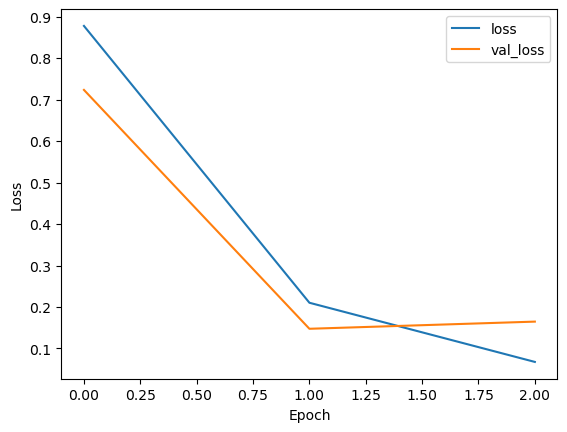

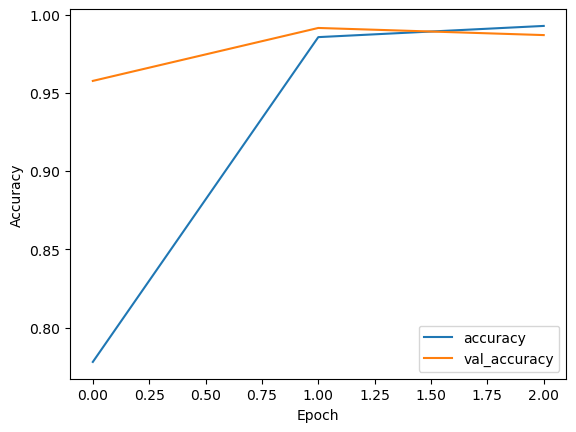

In [7]:
#code plots the training and validation loss and accuracy over the epochs from the model training history.
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show();

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['accuracy', 'val_accuracy'], loc='lower right')
plt.show();

In [8]:
#the code evaluates the trained CNN model on the test data and prints the test accuracy.
score = model_cnn.evaluate(X_test, y_test, verbose=0)
print("Test Accuracy: {:.2f}%".format(score[1]*100))

Test Accuracy: 98.70%


48/48 ━━━━━━━━━━━━━━━━━━━━ 15s 313ms/step


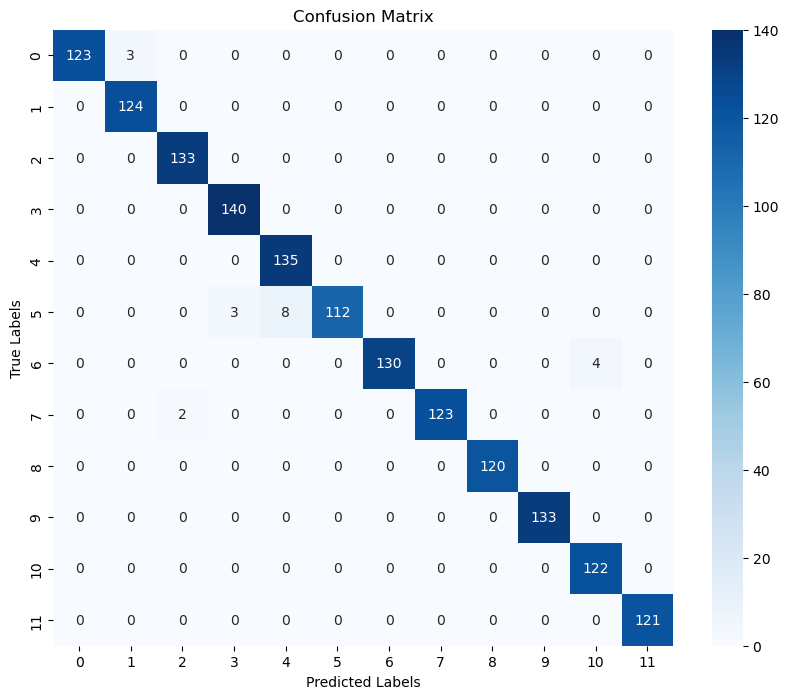

In [9]:
# Get predictions for test set
y_pred = model_cnn.predict(X_test)
# Convert one-hot encoded labels to class indices
y_test_class_indices = np.argmax(y_test, axis=1)
y_pred_class_indices = np.argmax(y_pred, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(y_test_class_indices, y_pred_class_indices)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.arange(12), yticklabels=np.arange(12))
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

### Model 2

In [10]:
#convolutional neural network (CNN) model with dropout regularization for multi-class classification is defined
model_cnn = Sequential(
    [
    Conv2D(filters=32, kernel_size=(3,3), activation='relu', input_shape=(343, 256,1)),
    MaxPooling2D(pool_size=(2,2)),
    Conv2D(filters=64, kernel_size=(3,3), activation='relu'),
    MaxPooling2D(pool_size=(2,2)),
    Flatten(),
    Dropout(rate=0.7),
    Dense(units=128, activation='relu'),
    Dense(units=12, activation='softmax')
    ])

model_cnn.summary()

C:\Users\amazi\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 341, 254, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 170, 127, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 168, 125, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 84, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 333312)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 333312)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │      42,664,064 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 42,684,428 (162.83 MB)

 Trainable params: 42,684,428 (162.83 MB)

 Non-trainable params: 0 (0.00 B)

In [11]:
#CNN model for multi-class classification on the training data is compiled and trained

model_cnn.compile(loss='categorical_crossentropy',
                optimizer='adam',
                metrics=['accuracy'])

history=model_cnn.fit(X_train, y_train,
            epochs=3,
            batch_size=32,
            validation_data=(X_test, y_test),
            verbose=0)



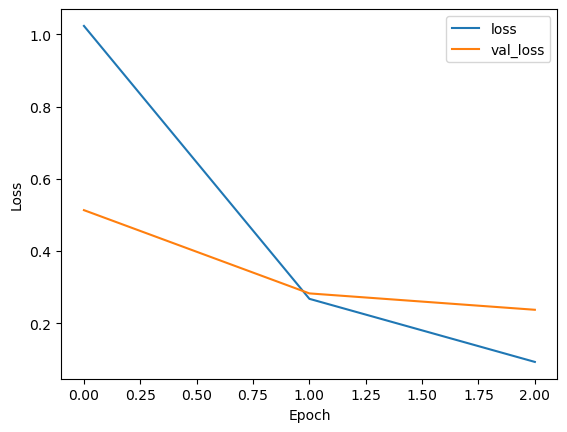

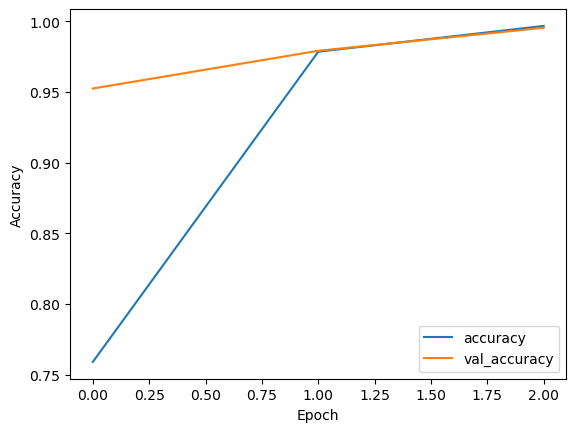

In [12]:
#code plots the training and validation loss and accuracy over the epochs from the model training history.
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show();

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['accuracy', 'val_accuracy'], loc='lower right')
plt.show();

In [13]:
#the code evaluates the trained CNN model on the test data and prints the test accuracy.
score = model_cnn.evaluate(X_test, y_test, verbose=0)
print("Test Accuracy: {:.2f}%".format(score[1]*100))

Test Accuracy: 99.54%


48/48 ━━━━━━━━━━━━━━━━━━━━ 14s 293ms/step


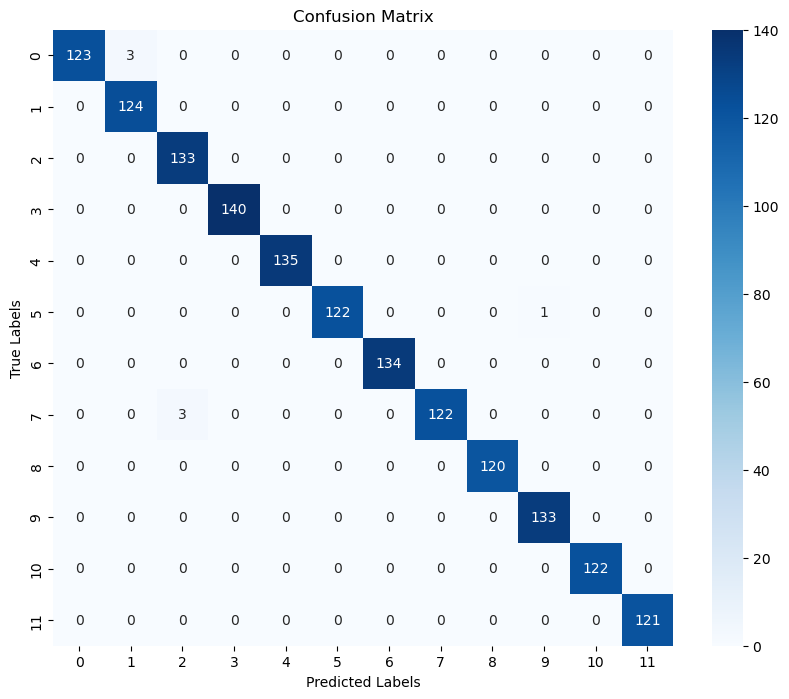

In [14]:
# Get predictions for test set
y_pred = model_cnn.predict(X_test)
# Convert one-hot encoded labels to class indices
y_test_class_indices = np.argmax(y_test, axis=1)
y_pred_class_indices = np.argmax(y_pred, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(y_test_class_indices, y_pred_class_indices)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.arange(12), yticklabels=np.arange(12))
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()